# **Exploratory data analysis of socially responsible investment opportunities into real estate of King County (WA, USA)**

<div align="center">
    <table >
     <tr>
       <td>Erin Robinson <i>(The Client)</i> is a socially responsible investor in the real estate. She wishes to improve living conditions in King County (WA, USA) by investing into the development of poor neighborhoods. </td>
        <td><img src="images/thispersondoesnotexist.jpg" width="450" alt="Erin Robinson profile pic"/></td>
     </tr>
    </table>
</div>

<center><img src="https://external-content.duckduckgo.com/iu/?u=https%3A%2F%2Fi.ytimg.com%2Fvi%2FZQ9nIFQN0To%2Fmaxresdefault.jpg&f=1&nofb=1&ipt=86184f32313e4b4eb90020edc7c252cf19c97df3162bee951040f2984194a4f1&ipo=images" height="400"/></center>

>From the Client's profile, we can make the following **assumptions**:
>* The client wants to build up and renovate
>   * This implies that the property condition should be average and below
>* The client targets the properties of average tier and below, complitely *excluding* the luxorious houses. 
>* The client targets long-term goals and the timing is not very important

# The dataset

The dataset consists of Price of Houses in King County, Washington 
from sales **between May 2014 and May 2015** and was provided by [@neuefische](https://github.com/neuefische). 
Along with house price it consists of information on 18 house features, 
date of sale and ID of sale.

The dataset is based on the [`house_data`](https://www.kaggle.com/datasets/arathipraj/house-data) 
and [`house_sales`](https://www.kaggle.com/datasets/andykrause/kingcountysales) datasets on Kaggle.

| Field             | Description                                                     |
|-------------------|-----------------------------------------------------------------|
| `id`                | Unique identifier for a house                                   |
| `dateDate`          | Date the house was sold                                         |
| `pricePrice`        | Prediction target - Price                                       |
| `bedrooms`          | Number of bedrooms                                              |
| `bathrooms`         | Number of bathrooms                                             |
| `sqft_livingsquare` | Footage of the home                                             |
| `sqft_lotsquare`    | Footage of the lot                                              |
| `floorsTotal`       | Total number of floors (levels) in the house                    |
| `waterfront`        | Indicates whether the house has a view to a waterfront         |
| `view`              | Quality of the view                                             |
| `condition`         | Overall [condition](https://info.kingcounty.gov/assessor/esales/Glossary.aspx?type=r#building%20condition) of the house                                  |
| `grade`             | Overall [grade](https://info.kingcounty.gov/assessor/esales/Glossary.aspx?type=r#building%20grade) given to the housing unit based on grading system |
| `sqft_above`        | Square footage of the house apart from the basement            |
| `sqft_basement`     | Square footage of the basement                                  |
| `yr_built`          | Year the house was built                                        |
| `yr_renovated`      | Year when the house was renovated                               |
| `zipcode`           | Zip code                                                        |
| `lat`               | Latitude coordinate                                             |
| `long`              | Longitude coordinate                                            |
| `sqft_living15`     | The square footage of interior housing living space for the nearest 15 neighbors |
| `sqft_lot15`        | The square footage of the land lots of the nearest 15 neighbors |


## The analysis plan

### **Questions to ask**
1. How to define a "poor neighborhood"?
2. How does the house condition affect its price? 
3. How much renovation is worth it, if at all?

### **Hypotheses**

1. The `price` grows with the building `condition` and `grade`. *This is the basis for Erin's strategy: if this does not hold true, the investment in restoration does not make economical sense!*
    
2. The `price` is defined by surroundings: the proximity to the Seattle downtown as well as the particular `zipcode`

### *Scope*
Since there is data for only a single year, I do not conduct any time series analysis, because I believe that this is fundamentally not enough data for any reliable conclusions.

# Preparation

## Imports and global settings

In [40]:
# Imports
import warnings

warnings.filterwarnings("ignore")

import pandas as pd
import numpy as np

#Plotting
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio

# Settings
plt.rcParams.update({ "figure.figsize" : (8, 5),"axes.facecolor" : "white", "axes.edgecolor":  "black"})
plt.rcParams["figure.facecolor"]= "w"
pd.plotting.register_matplotlib_converters()

# to display all columns in the large dataset
pd.set_option('display.max_columns', None) 
plt.style.use('bmh')

px.defaults.width = 600
px.defaults.height = 400

## Definitions

In [41]:
def geoplot(data, size_col, color_col, 
            title="King county housings",
            alpha=1, marker_max_size=20,
            colorscheme="Portland"):
    
    cb_title=color_col.capitalize()
    cb_title=cb_title.replace('_', ' ')

    hover_label=size_col.capitalize()
    hover_label=hover_label.replace('_', ' ')
    
    marker_sizes = np.exp(data[size_col].max() + 2 - data[size_col])

    # Plots the main figure
    fig = px.scatter_mapbox(
        data,
        lat='lat',
        lon='long',
        opacity=alpha,
        zoom=8,
        mapbox_style='open-street-map', 
        size=marker_sizes,
        size_max=marker_max_size,  
        color=color_col,
        color_continuous_scale = colorscheme,
        title = title,
        template='plotly_white'
    )

    # updates markers and tooltips
    fig.update_traces(
        hovertemplate =
                f'<b>{hover_label}<b>: ' + data[size_col].astype('str') + '</b><br>' 
    )

    # updating height, width, margins and other layout properties
    fig.update_layout(
        width=700,
        height=500,
        title_font_size=28,
        margin=dict(l=0, r=0, t=60, b=0),  # Set margins (pixels)
        title={
            'text': title,
            'y':0.95,
            'x':0.5,
            'xanchor': 'center',
            'yanchor': 'top'},
        coloraxis_colorbar=dict(
            title=cb_title,
            #tickvals=np.linspace(df.price_log.min(), df.price_log.max(), 5),
            #ticktext=np.linspace(df.price.min(), df.price.max(), 5),
                        )
    )

    return fig

In [42]:
def corr_matrix_plot(corm, labels, ax):
    mask = np.zeros_like(corm, dtype='bool')
    mask[np.tril_indices_from(mask)] = True
    mask[np.diag_indices_from(mask)] = False
    cm = sns.heatmap(corm, mask=mask, annot=True, fmt='.2f',
                cmap='seismic', vmin=-1, vmax=1, 
                #style='white',
                cbar=False, square=True,
                xticklabels=labels,
                yticklabels=labels, ax=ax)
    return cm

In [43]:
PI = np.pi
R = 6371 # km - Earth radius

def radians(degrees):  
    return degrees * PI / 180

def geo_distance_km(coord1, coord2):
    '''Calculates distance between two points on the map
    according to Haversine formula:
    d = 2R × sin⁻¹(√[sin²((θ₂ - θ₁)/2) + cosθ₁ × cosθ₂ × sin²((φ₂ - φ₁)/2)])
    
    Parameters:
    coord1, coord2 - pairs of coordinates in the form (lat, long)
    Returns:
     d - distance between coord1 and coord2 in kilometers '''
    
   # d = 2R × sin⁻¹(√[sin²((θ₂ - θ₁)/2) + cosθ₁ × cosθ₂ × sin²((φ₂ - φ₁)/2)])
    # Convert latitude and longitude from degrees to radians
    lat1, lon1 = radians(coord1[0]), radians(coord1[1])
    lat2, lon2 = radians(coord2[0]), radians(coord2[1])

    # Calculate the differences in coordinates
    dlat = lat2 - lat1
    dlon = lon2 - lon1

    d = 2 * R * np.arcsin(np.sqrt( 
          np.sin(dlat)**2 + np.cos(lat1) * np.cos(lat2) \
        * np.sin(dlon/2)**2
    ))
    return d

In [44]:
def filledline(data, ycol, ystdcol, xcol=None, xlabel='', ylabel='', title='', color='rgba(71, 103, 158, 1)'):
    if xcol is None:
        x = list(data.index.values)
    x_rev = x[::-1]
    y = list(data[ycol].values)
    color_fill=color.replace(' ', '')
    color_fill=color_fill.replace(',1)', ',0.2)')

    y_upper = list((data[ycol] + data[ystdcol]*0.5).values)
    y_lower = list((data[ycol] - data[ystdcol]*0.5).values)

    y_lower = y_lower[::-1]
    fig = go.Figure()
    fig.add_trace(go.Scatter(
        x=x+x_rev,
        y=y_upper+y_lower,
        fill='toself',
        fillcolor=color_fill,
        line_color='rgba(255,255,255,0)',
        showlegend=False,    
    ))

    fig.add_trace(go.Scatter(
        x=x, y=y,
        line_color=color,
        name='Price',
        showlegend=False, 
        marker=dict(size=data['count']/100, sizemin=1, 
                          line_color='rgba(255,255,255,0)', ),
        text=data['count'],
        hovertemplate='Total of %{text} houses',
    ))

    fig.update_layout(title=title, margin=dict(l=0, r=0, t=80, b=0), 
                      xaxis_title=xlabel, yaxis_title=ylabel, template='seaborn')
    return fig

# Data cleaning

In [45]:
#reading the file with an attempt to authomaticly parse the dates
df = pd.read_csv('data/houses.csv', parse_dates=['sale_date'], date_format='%d/%m/%Y')
df.head(10).style.format(precision=1)

,id,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,sale_date,price
0,7129300520,3.0,1.0,1180.0,5650.0,1.0,nan,0.0,3,7,1180.0,0.0,1955,0.0,98178,47.5,-122.3,1340.0,5650.0,2014-10-13,221900.0
1,6414100192,3.0,2.2,2570.0,7242.0,2.0,0.0,0.0,3,7,2170.0,400.0,1951,19910.0,98125,47.7,-122.3,1690.0,7639.0,2014-12-09,538000.0
2,5631500400,2.0,1.0,770.0,10000.0,1.0,0.0,0.0,3,6,770.0,0.0,1933,nan,98028,47.7,-122.2,2720.0,8062.0,2015-02-25,180000.0
3,2487200875,4.0,3.0,1960.0,5000.0,1.0,0.0,0.0,5,7,1050.0,910.0,1965,0.0,98136,47.5,-122.4,1360.0,5000.0,2014-12-09,604000.0
4,1954400510,3.0,2.0,1680.0,8080.0,1.0,0.0,0.0,3,8,1680.0,0.0,1987,0.0,98074,47.6,-122.0,1800.0,7503.0,2015-02-18,510000.0
5,7237550310,4.0,4.5,5420.0,101930.0,1.0,0.0,0.0,3,11,3890.0,1530.0,2001,0.0,98053,47.7,-122.0,4760.0,101930.0,2014-05-12,1230000.0
6,1321400060,3.0,2.2,1715.0,6819.0,2.0,0.0,0.0,3,7,1715.0,nan,1995,0.0,98003,47.3,-122.3,2238.0,6819.0,2014-06-27,257500.0
7,2008000270,3.0,1.5,1060.0,9711.0,1.0,0.0,nan,3,7,1060.0,0.0,1963,0.0,98198,47.4,-122.3,1650.0,9711.0,2015-01-15,291850.0
8,2414600126,3.0,1.0,1780.0,7470.0,1.0,0.0,0.0,3,7,1050.0,730.0,1960,0.0,98146,47.5,-122.3,1780.0,8113.0,2015-04-15,229500.0
9,3793500160,3.0,2.5,1890.0,6560.0,2.0,0.0,0.0,3,7,1890.0,0.0,2003,0.0,98038,47.4,-122.0,2390.0,7570.0,2015-03-12,323000.0


In [46]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21597 non-null  int64  
 1   bedrooms       21597 non-null  float64
 2   bathrooms      21597 non-null  float64
 3   sqft_living    21597 non-null  float64
 4   sqft_lot       21597 non-null  float64
 5   floors         21597 non-null  float64
 6   waterfront     19206 non-null  float64
 7   view           21534 non-null  float64
 8   condition      21597 non-null  int64  
 9   grade          21597 non-null  int64  
 10  sqft_above     21597 non-null  float64
 11  sqft_basement  21145 non-null  float64
 12  yr_built       21597 non-null  int64  
 13  yr_renovated   17749 non-null  float64
 14  zipcode        21597 non-null  int64  
 15  lat            21597 non-null  float64
 16  long           21597 non-null  float64
 17  sqft_living15  21597 non-null  float64
 18  sqft_l

Takeaways: 
* ✔️ The column names are already in a good format
* ✔️ The dates were parsed correctly
* ❗️ `yr_renovated` has missing values. Which is expected because not every house needs renovation; also, small scale cosmetic works may not be documented at all. The values should be reformatted (e.g. $19910.0$ -> $1991$) and imputed.
> Assumption: BOTH the missing values AND zeroes in the renovation year column `yr_renovated`mean the house has **never** been renovated
* ❗️ `waterfront` has missing values which should be imputed.
> Hypothesis: missing values are equivalent to 0 (or NO waterfront in sight). Can be verified with geoplots.
* ❗️ `sqft_basement` has missing values which should be imputed. According to the table documentation, area of basement is already implicitly contained in `sqft_living`. So we can simply recalculate the whole column as a difference between `sqft_living`and `sqft_above`. 

*For convenience of the European Analyst, we will also convert the Imperial units to the Metric system*

### Imputing

`yr_renovated`

In [47]:
# Get the column yr_renovated into the good format:

df.yr_renovated.unique()

array([    0., 19910.,    nan, 20020., 20100., 19920., 20130., 19940.,
       19780., 20050., 20030., 19840., 19540., 20140., 20110., 19830.,
       19450., 19900., 19880., 19770., 19810., 19950., 20000., 19990.,
       19980., 19700., 19890., 20040., 19860., 20070., 19870., 20060.,
       19850., 20010., 19800., 19710., 19790., 19970., 19500., 19690.,
       19480., 20090., 20150., 19740., 20080., 19680., 20120., 19630.,
       19510., 19620., 19530., 19930., 19960., 19550., 19820., 19560.,
       19400., 19760., 19460., 19750., 19640., 19730., 19570., 19590.,
       19600., 19670., 19650., 19340., 19720., 19440., 19580.])

In [48]:
df['yr_renovated'].fillna(0, inplace=True) 
df['yr_renovated'] = (df.yr_renovated / 10).astype(int)
df['yr_renovated'].replace(0, np.nan, inplace=True) # this is the only way that works!

df.head()

,id,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,sale_date,price
0,7129300520,3.0,1.00,1180.0,5650.0,1.0,NaN,0.0,3,7,1180.0,0.0,1955,NaN,98178,47.5112,-122.257,1340.0,5650.0,2014-10-13,221900.0
1,6414100192,3.0,2.25,2570.0,7242.0,2.0,0.0,0.0,3,7,2170.0,400.0,1951,1991.0,98125,47.7210,-122.319,1690.0,7639.0,2014-12-09,538000.0
2,5631500400,2.0,1.00,770.0,10000.0,1.0,0.0,0.0,3,6,770.0,0.0,1933,NaN,98028,47.7379,-122.233,2720.0,8062.0,2015-02-25,180000.0
3,2487200875,4.0,3.00,1960.0,5000.0,1.0,0.0,0.0,5,7,1050.0,910.0,1965,NaN,98136,47.5208,-122.393,1360.0,5000.0,2014-12-09,604000.0
4,1954400510,3.0,2.00,1680.0,8080.0,1.0,0.0,0.0,3,8,1680.0,0.0,1987,NaN,98074,47.6168,-122.045,1800.0,7503.0,2015-02-18,510000.0


`waterfront`

In [49]:
df.waterfront.unique()

array([nan,  0.,  1.])

In [50]:
df['waterfront'] = df.waterfront.fillna(0).astype('int0') # converting to the approprite type as well

`sqft_basement`

Checking if the values are alright: What area of the basement is in the rows which do NOT add up to the `sqft_living` value?

In [51]:
# It would be a problem if there were any values (but None)
df[(df.sqft_living - df.sqft_above != df.sqft_basement)].sqft_basement.unique() 

array([nan])

Looks good, so we are simply recalculating the column:

In [52]:
df.eval('sqft_basement = sqft_living - sqft_above', inplace=True)

# Adding a column that is easier to analyse
df.eval('basement_share = sqft_basement / sqft_living', inplace=True)

Finally, let's transform feet to meters: 

In [53]:
cols = df.columns

cols_area = [c for c in cols if 'sqft' in c]
cols_area_new = [c.replace('sqft', 'm2') for c in cols_area]

df[cols_area] = df[cols_area] / 10.764
df.rename(columns={old: new for old, new in zip(cols_area, cols_area_new)}, inplace=True)
df.head()

,id,bedrooms,bathrooms,m2_living,m2_lot,floors,waterfront,view,condition,grade,m2_above,m2_basement,yr_built,yr_renovated,zipcode,lat,long,m2_living15,m2_lot15,sale_date,price,basement_share
0,7129300520,3.0,1.00,109.624675,524.897808,1.0,0,0.0,3,7,109.624675,0.000000,1955,NaN,98178,47.5112,-122.257,124.489038,524.897808,2014-10-13,221900.0,0.000000
1,6414100192,3.0,2.25,238.758826,672.798216,2.0,0,0.0,3,7,201.597919,37.160907,1951,1991.0,98125,47.7210,-122.319,157.004831,709.680416,2014-12-09,538000.0,0.155642
2,5631500400,2.0,1.00,71.534745,929.022668,1.0,0,0.0,3,6,71.534745,0.000000,1933,NaN,98028,47.7379,-122.233,252.694166,748.978075,2015-02-25,180000.0,0.000000
3,2487200875,4.0,3.00,182.088443,464.511334,1.0,0,0.0,5,7,97.547380,84.541063,1965,NaN,98136,47.5208,-122.393,126.347083,464.511334,2014-12-09,604000.0,0.464286
4,1954400510,3.0,2.00,156.075808,750.650316,1.0,0,0.0,3,8,156.075808,0.000000,1987,NaN,98074,47.6168,-122.045,167.224080,697.045708,2015-02-18,510000.0,0.000000


### Feature engineering

Let's add a few columns for our convenience:
* `age`: age of the building. Easier to read than the `yr_built`
* `yrs_since_renovation`: years since the last documented renovation
* `p_per_m2`: price per square meter, a common metric of the property value.

In [54]:
CURRENT_YEAR = 2015
df = df.assign(age = CURRENT_YEAR - df.yr_built,
          yrs_since_renovation = CURRENT_YEAR - df.yr_renovated,
          p_per_m2 = np.round(df.price / df.m2_living, 1) # digits beyond the decimal are not relevant
          )
df.head()

,id,bedrooms,bathrooms,m2_living,m2_lot,floors,waterfront,view,condition,grade,m2_above,m2_basement,yr_built,yr_renovated,zipcode,lat,long,m2_living15,m2_lot15,sale_date,price,basement_share,age,yrs_since_renovation,p_per_m2
0,7129300520,3.0,1.00,109.624675,524.897808,1.0,0,0.0,3,7,109.624675,0.000000,1955,NaN,98178,47.5112,-122.257,124.489038,524.897808,2014-10-13,221900.0,0.000000,60,NaN,2024.2
1,6414100192,3.0,2.25,238.758826,672.798216,2.0,0,0.0,3,7,201.597919,37.160907,1951,1991.0,98125,47.7210,-122.319,157.004831,709.680416,2014-12-09,538000.0,0.155642,64,24.0,2253.3
2,5631500400,2.0,1.00,71.534745,929.022668,1.0,0,0.0,3,6,71.534745,0.000000,1933,NaN,98028,47.7379,-122.233,252.694166,748.978075,2015-02-25,180000.0,0.000000,82,NaN,2516.3
3,2487200875,4.0,3.00,182.088443,464.511334,1.0,0,0.0,5,7,97.547380,84.541063,1965,NaN,98136,47.5208,-122.393,126.347083,464.511334,2014-12-09,604000.0,0.464286,50,NaN,3317.1
4,1954400510,3.0,2.00,156.075808,750.650316,1.0,0,0.0,3,8,156.075808,0.000000,1987,NaN,98074,47.6168,-122.045,167.224080,697.045708,2015-02-18,510000.0,0.000000,28,NaN,3267.6


Now let's check if there are any abnormalities in the data 

In [55]:
df.describe().drop('id', axis=1) \
    .drop('count')               \
    .style.format(precision=1) 
# This view truncates the lat and long columns, but we will get to them later 

,bedrooms,bathrooms,m2_living,m2_lot,floors,waterfront,view,condition,grade,m2_above,m2_basement,yr_built,yr_renovated,zipcode,lat,long,m2_living15,m2_lot15,price,basement_share,age,yrs_since_renovation,p_per_m2
mean,3.4,2.1,193.3,1402.8,1.5,0.0,0.2,3.4,7.7,166.2,27.1,1971.0,1995.9,98078.0,47.6,-122.2,184.6,1185.3,540296.6,0.1,44.0,19.1,2843.2
std,0.9,0.8,85.3,3847.3,0.5,0.1,0.8,0.7,1.2,76.9,41.1,29.4,15.6,53.5,0.1,0.1,63.7,2533.9,367368.1,0.2,29.4,15.6,1184.0
min,1.0,0.5,34.4,48.3,1.0,0.0,0.0,1.0,3.0,34.4,0.0,1900.0,1934.0,98001.0,47.2,-122.5,37.1,60.5,78000.0,0.0,0.0,0.0,942.8
25%,3.0,1.8,132.9,468.2,1.0,0.0,0.0,3.0,7.0,110.6,0.0,1951.0,1987.0,98033.0,47.5,-122.3,138.4,473.8,322000.0,0.0,18.0,7.8,1962.2
50%,3.0,2.2,177.4,707.7,1.5,0.0,0.0,3.0,7.0,144.9,0.0,1975.0,2000.0,98065.0,47.6,-122.2,170.9,707.9,450000.0,0.0,40.0,15.0,2633.4
75%,4.0,2.5,236.9,992.7,2.0,0.0,0.0,4.0,8.0,205.3,52.0,1997.0,2007.2,98118.0,47.7,-122.1,219.2,936.7,645000.0,0.3,64.0,28.0,3426.5
max,33.0,8.0,1257.9,153415.0,3.5,1.0,4.0,5.0,13.0,874.2,447.8,2015.0,2015.0,98199.0,47.8,-121.3,576.9,80936.5,7700000.0,0.7,115.0,81.0,8720.3


**Observations**
* Some houses in the dataset are really large ($33$ bedrooms and / or $8$ bathrooms), which are likely multi-family houses or hotels.

* The cheapest house is just **$78 000**, which can be really promising
* Only $25$ % of houses have `basement`
* The `view` grade ranges from 0 to 4 with the absolute majority of the houses (at least 75%) rated as 0
* The largest `lot` is huge, it is $153000$ $m^2$! Is it a farm or a manson?
* There is a house with 33 `bedrooms`?? Must be a mistake

In [56]:
df[df.bedrooms > 20]

,id,bedrooms,bathrooms,m2_living,m2_lot,floors,waterfront,view,condition,grade,m2_above,m2_basement,yr_built,yr_renovated,zipcode,lat,long,m2_living15,m2_lot15,sale_date,price,basement_share,age,yrs_since_renovation,p_per_m2
15856,2402100895,33.0,1.75,150.501672,557.413601,1.0,0,0.0,5,7,96.618357,53.883315,1947,NaN,98103,47.6878,-122.331,123.560015,436.640654,2014-06-25,640000.0,0.358025,68,NaN,4252.4


In [57]:
print(df.loc[15856].m2_living / df.loc[15856].bedrooms )

4.560656734569778


Every bedroom is less than $4$ $m^2$. It has been built right after the end of WW2 and can be a military dorm. Or a former prison. However, most likely, this is just a typographic error: It only has 1 bathroom for 33 people?
Let's just remove it.

In [58]:
df.drop(15856, inplace=True)

Let's have a look at the distributions:

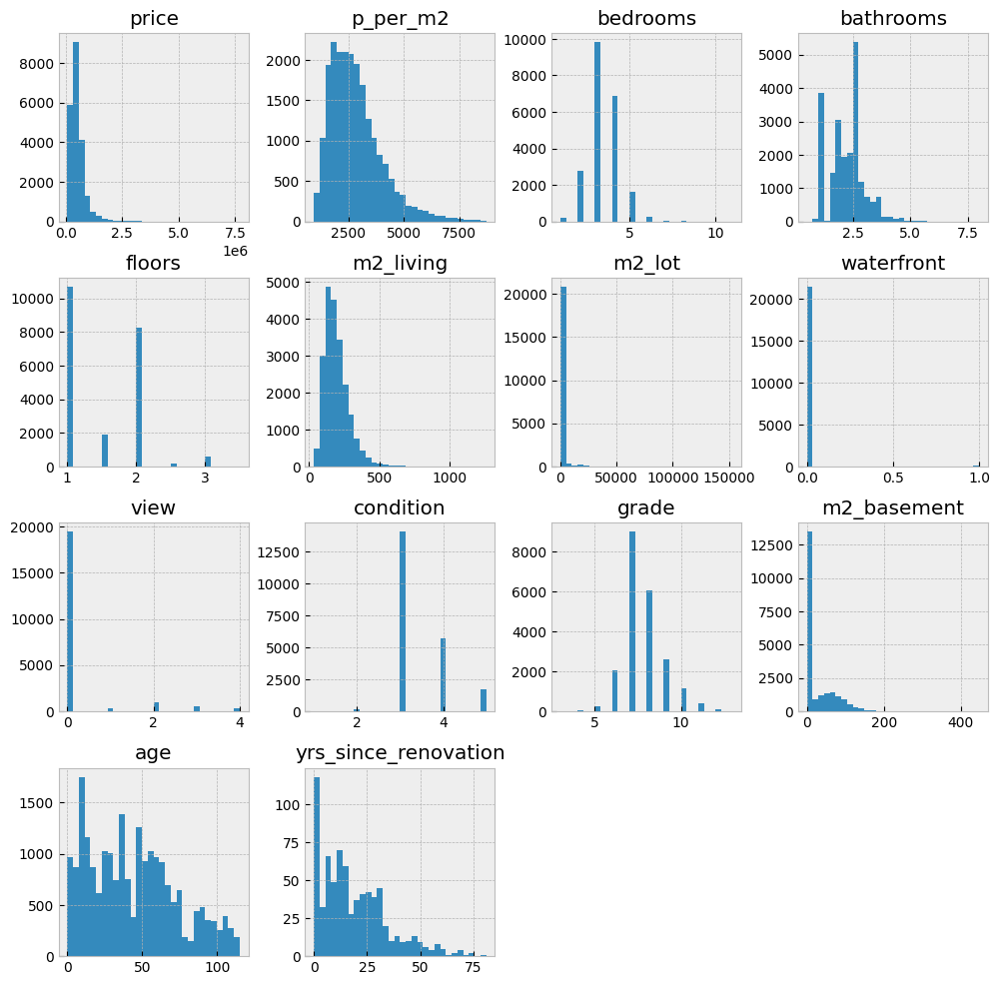

In [59]:
# No geodata: we will plot it on a map
df.hist(column=['price', 'p_per_m2', 'bedrooms', 'bathrooms', 'floors', 'm2_living', 'm2_lot', 
       'waterfront', 'view', 'condition', 'grade', 'm2_basement',
       'age', 'yrs_since_renovation'],
       figsize=(12, 12), bins=30);

* The `price`distribution is very skewed: there are very few very expensive properties. 
    * The median selling `price` is about **$0.5 M**
* There are only a few houses in the `condition`below "average" ($3$)
* The `lot` size distribution is even more skewed: there are single enormou(s) lot(s); the largest `lot` is huge, it is $153000$ $m^2$! Is it a farm or a manson?
* The `view` grade ranges from 0 to 4 with the absolute majority of the houses rated as 0
* The overall house `grade` is symmetrically distributed and in the current sample ranges from $3$ (a barely livable cabin) to $13$ (a manson) with the median of $7$ (*average* quality) 


Let's look at the disstribution of the most prominent feature, the `price`:

In [60]:
fig = px.box(df, x='price', height=300, template='seaborn')
fig.update_layout(margin={'l':0, 't':0, 'r':0, 'b': 30})
fig.show()

Following our *presumption* that the Client is *not* interested in the luxorious properties, it is totally safe to discard the houses that form the right tail of the price distribution: anything above the Q3 + 1.5 IQR (the right whisker of the box plot)

In [61]:
dfp = df[df.price < 1.12e6]

In [62]:
dfp.drop('id',axis=1).describe().style.format(precision=1) 

,bedrooms,bathrooms,m2_living,m2_lot,floors,waterfront,view,condition,grade,m2_above,m2_basement,yr_built,yr_renovated,zipcode,lat,long,m2_living15,m2_lot15,price,basement_share,age,yrs_since_renovation,p_per_m2
count,20426.0,20426.0,20426.0,20426.0,20426.0,20426.0,20368.0,20426.0,20426.0,20426.0,20426.0,20426.0,624.0,20426.0,20426.0,20426.0,20426.0,20426.0,20426.0,20426.0,20426.0,624.0,20426.0
mean,3.3,2.1,183.4,1354.7,1.5,0.0,0.2,3.4,7.5,158.6,24.8,1970.8,1995.5,98078.6,47.6,-122.2,178.5,1154.4,476316.7,0.1,44.2,19.5,2737.0
std,0.9,0.7,71.8,3717.9,0.5,0.0,0.6,0.6,1.0,67.5,37.9,29.2,16.2,53.3,0.1,0.1,57.0,2459.7,207267.2,0.2,29.2,16.2,1078.8
min,1.0,0.5,34.4,48.3,1.0,0.0,0.0,1.0,3.0,34.4,0.0,1900.0,1934.0,98001.0,47.2,-122.5,37.1,60.5,78000.0,0.0,0.0,0.0,942.8
25%,3.0,1.5,130.1,464.5,1.0,0.0,0.0,3.0,7.0,108.7,0.0,1951.0,1986.0,98033.0,47.5,-122.3,136.6,468.8,315000.0,0.0,19.0,7.0,1926.7
50%,3.0,2.0,172.1,696.8,1.0,0.0,0.0,3.0,7.0,141.2,0.0,1974.0,1999.0,98065.0,47.6,-122.2,167.2,700.5,437000.0,0.0,41.0,16.0,2562.9
75%,4.0,2.5,225.8,957.4,2.0,0.0,0.0,4.0,8.0,195.1,47.4,1996.0,2008.0,98118.0,47.7,-122.1,211.8,917.7,600000.0,0.3,64.0,29.0,3289.0
max,11.0,7.5,694.9,153415.0,3.5,1.0,4.0,5.0,12.0,530.5,252.7,2015.0,2015.0,98199.0,47.8,-121.3,499.8,80936.5,1110000.0,0.7,115.0,81.0,8720.3


In [63]:
fig = px.box(dfp, x='price', height=300, template='seaborn')
fig.update_layout(margin={'l':0, 't':0, 'r':0, 'b': 30})
fig.show()

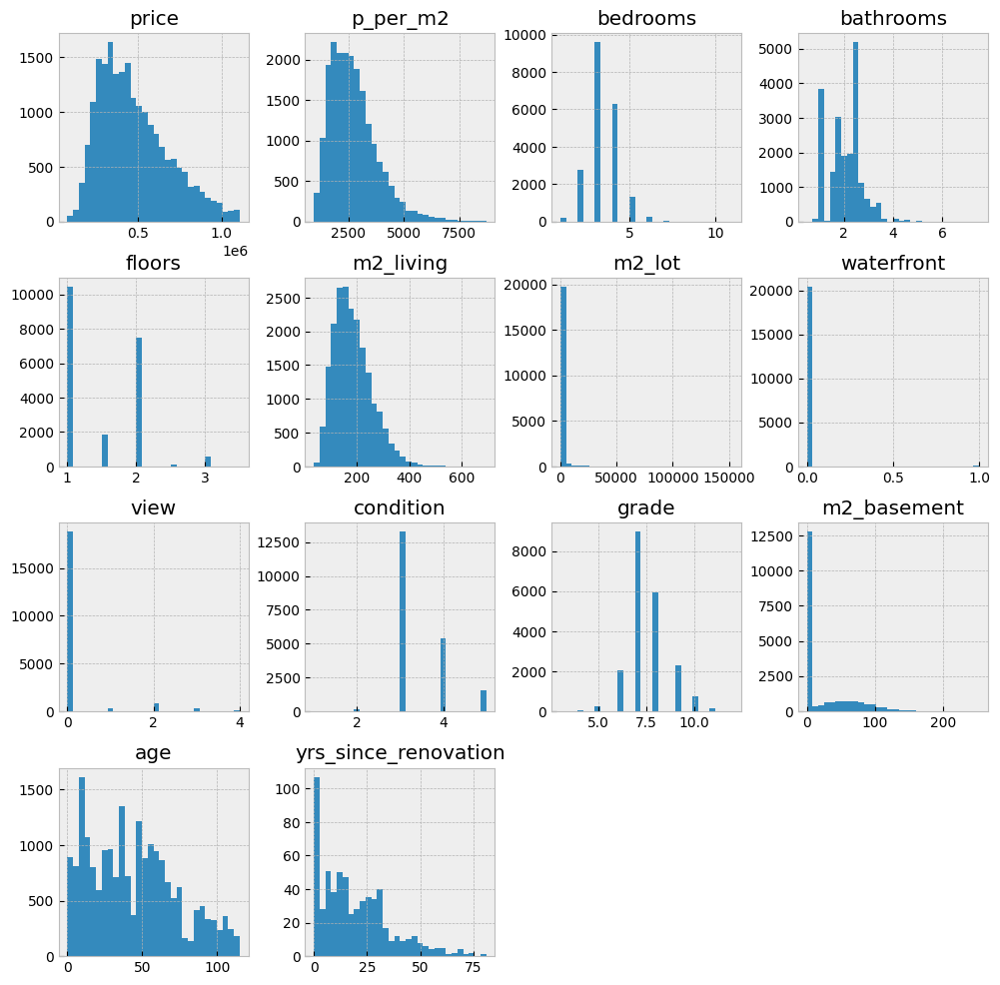

In [64]:
dfp.hist(column=['price', 'p_per_m2', 'bedrooms', 'bathrooms', 
                 'floors', 'm2_living', 'm2_lot', 'waterfront', 
                 'view', 'condition', 'grade', 'm2_basement',
                 'age', 'yrs_since_renovation'],
       figsize=(12, 12), bins=30);

Much better!
* The huge lot stayed: this is probably a farm
* Even fewer houses beside the water left. 
* We still have large houses with > 5 bedrooms and / or > 5 bathrooms!

### Creating the checkpoint by saving the imputed dataset 

In [65]:
dfp.to_csv('data/houses_processed.csv', index=False)

-----

# Exploration

**Loading the clean data**

In [66]:
dfp = pd.read_csv('data/houses_processed.csv')

### Geographical distribution

#### House quality (`grade`)
Let's have a look at the distribution of housing quality on the map. We'll put more weight on the low-graded houses since they are the focus of the Client.

In [67]:
fig = geoplot(dfp, size_col='grade', color_col='grade', 
    title='Housing grade distribution in King County<br>Color and dot size denote the building grade (zoom in and hover for values)', 
    marker_max_size=30,
    colorscheme=px.colors.diverging.Portland)
fig.update_layout(title_font_size=16)
fig.show()

**Observations** 
* High- and low-graded houses can be found anywhere but certain areas tend to be overall better or worse. 
* The west end (the White Center peninsula) and the overall airport areas are the worst-rated
* Large districts in the north-east (around the lake Sammamish) are the most exquisite: there are sporadic poorly graded houses but mostly the grades range from 7 and higher
*  Southern areas are heterogeneous: most of the houses are quite good (`grade` ≥ 7) but there are also clusters of low-graded houses.

In [68]:
# Defining a "neighborhood" as the zipcode grouped by the 
nbhds = dfp.loc[:, 'grade zipcode lat long'.split()]\
           .groupby('zipcode').mean()

In [69]:
geoplot(nbhds, size_col='grade', color_col='grade', 
        title='Poor neighborhoods',
        marker_max_size=20)

Building conditions

In [70]:
fig = geoplot(dfp, size_col='condition', color_col='condition', 
    title='Housing grade distribution in King County<br>Color and dot size denote the building grade (zoom in and hover for values)', 
    marker_max_size=8,
    colorscheme=px.colors.diverging.Portland)
fig.update_layout(title_font_size=16)
fig.show()

Sporadic houses in the bad `condition` are mor or less uniformly distributed all over the county and don't aggregate. The only exception is White Center (with West Seattle, Delridge, Rainer Valley, etc.). It is historically a lowly area accomodating military personnel and immigrants [[source]](https://www.loghousemuseum.org/history/white-center/)

In [71]:
fig = geoplot(dfp[dfp.condition <= 2], size_col='condition', color_col='condition', 
    title='Houses in condition below average', 
    marker_max_size=8,
    colorscheme=px.colors.make_colorscale(['#0c468f', '#0b6ca8']))
fig.update_layout(coloraxis_colorbar=None)
fig.show()

In [72]:
nbhds_cond = dfp.loc[:, 'condition zipcode lat long'.split()]\
           .groupby('zipcode').mean()
geoplot(nbhds_cond, size_col='condition', color_col='condition', 
        title='Average building condition by zipcode',
        marker_max_size=15)

The two maps above demonstrate the limitation of this aggregation method: the rural `zipcodes` cover much larger areas than those withi the cities, however the highly dispersed houses do not make up a *neighborhood*. This is demonstrated by *Snoquaimie Forest* in the north east. If we wanted to make a precise definition of a *poor neighborhood* we would rely on proximity between the houses and identify *clusters* of low-graded houses (which will correspond to particular streets, zones, quarters very precisely). 

However, this crude classification still works quite well for the densely populated areas, and is generally enough for us now to filter the data. We can hand-pick the investment recommendation for the Client later.

In [73]:
fig = px.box(nbhds, x='grade', height=200, template='seaborn')
fig.update_layout(title='Distribution of average house grades by the zipcode', 
                  margin={'l':0, 't':30, 'r':0, 'b': 30})
fig.show()

>We will select the zipcodes with the average grade below the *mode=7.4* for our Client

#### House `price`

In [74]:
geoplot(dfp, size_col='grade', color_col='price', title='Building condition and price', 
              marker_max_size=20, colorscheme=px.colors.sequential.Cividis, alpha=0.6)

In [75]:
geoplot(dfp, size_col='condition', color_col='p_per_m2', title='Building condition and price of a sqare meter', 
              marker_max_size=20, colorscheme=px.colors.sequential.Cividis, alpha=0.7)

This plot shows very clear dependance of price of a square meter on the location of the lot.

In [76]:
center_lat = dfp.lat.agg(np.average, weights=dfp.price)
center_long = dfp.long.agg(np.average, weights=dfp.price)

dfp = dfp.assign(dist_from_center = 
                 geo_distance_km((center_lat, center_long), (dfp.lat, dfp.long)))

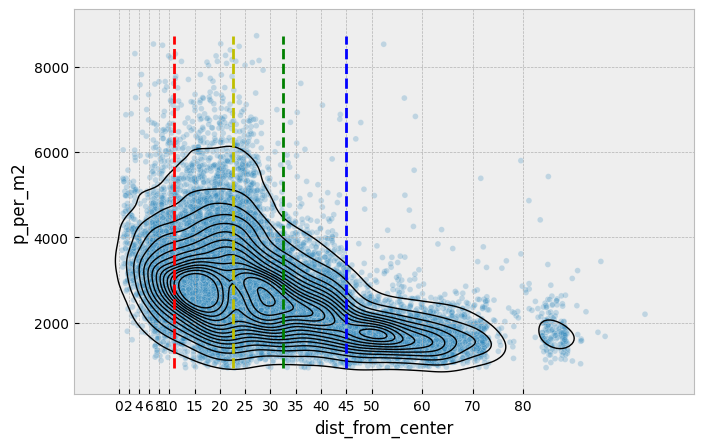

In [77]:
sns.kdeplot(dfp, x='dist_from_center', y='p_per_m2', color='k', linewidths=1, levels=15,)
sns.scatterplot(dfp, x='dist_from_center', y='p_per_m2', size=1, alpha=0.25, legend=False);
plt.xticks([0,2,4,6,8,10,15,20,25,30,35,40,45,50,60,70,80]);
plt.vlines(x=[11, 22.5, 32.5, 45], ymin=dfp.p_per_m2.min(), ymax=dfp.p_per_m2.max(), 
           linestyles='dashed', colors=['r', 'y', 'g', 'b']);

Alright, there are about four zones. The most central region (the leftmost tail on the KDE plot) tends to have higher prices than the other three regions further away from the center (bright points concentrated in the center on the map above); the third peak (which must be the southern area) lies already in the much lower price range (the dark blue dots prevail). 

Let's break the data up into this four zones and look at the qualitative tendencies

> Note: we make the linear fits with `seaborn` using the flag `robust=Ture`, which makes the fit resistant to outliers

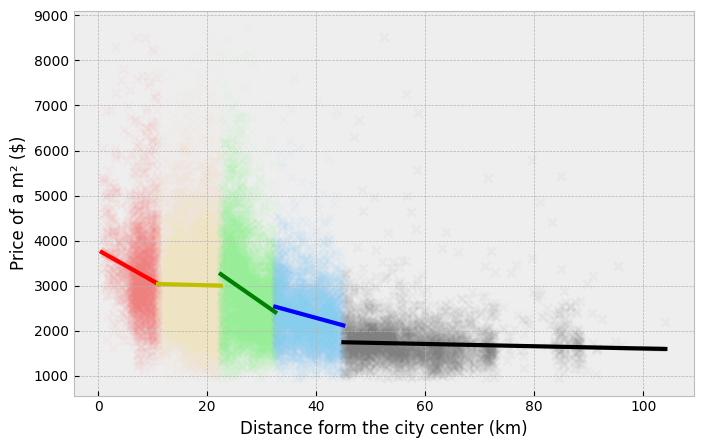

In [79]:
queries = ['dist_from_center <= 11', 
           'dist_from_center > 11 and dist_from_center <= 22.5', 
           'dist_from_center > 22.5 and dist_from_center <= 32.5', 
           'dist_from_center > 32.5 and dist_from_center <= 45',
           'dist_from_center > 45']
colors_markers = ['lightcoral', 'bisque', 'palegreen', 'lightskyblue', 'gray']
colors_lines = ['r', 'y', 'g', 'b', 'k']

for query, cm, cl in zip(queries, colors_markers, colors_lines):
  sns.regplot(dfp.query(query), 
              x='dist_from_center', y='p_per_m2', 
              robust=True, # This flag makes the liear fit being resistant to outliers
              line_kws=dict(color=cl), 
              scatter_kws=dict(color=cm, alpha=0.05),
              marker="x", 
            )
plt.xlabel('Distance form the city center (km)')
plt.ylabel('Price of a m² ($)');

* The price in the <span style="color:red">**first** </span> zone highly depends on the location
* The price in the <span style="color:yellow">**second** </span> zone does **not** depend on the proximity to the center
* The price in the <span style="color:green">**third** </span> and <span style="color:blue">**fourth** </span> zones drop with the distance at a different rate
* The <span style="color:black">**last** </span> zone is the cheapest overall (these are the southern and eastern towns)

## Apart from the location, what affects the price?

Let's take the zones of constant price and look, what affects the price.

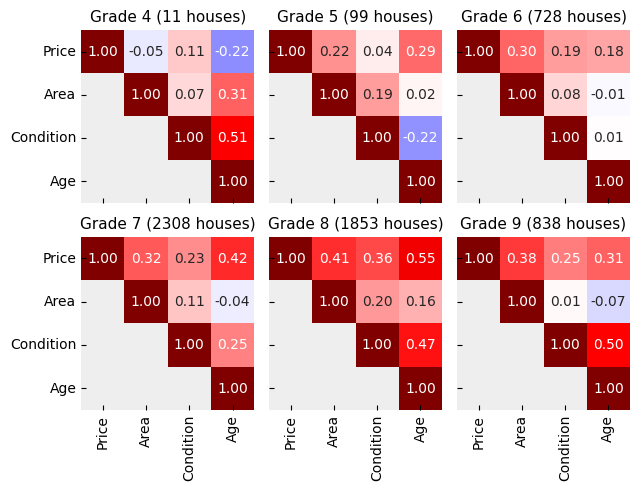

In [ ]:
dfp_z2 = dfp.query('dist_from_center > 11 and dist_from_center <= 22.5') 

groups = dfp_z2[['price', 'm2_living', 'condition', 'age', 'grade']].groupby('grade')

fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(6.5,5), sharex=True, sharey=True)
labels = ['Price', 'Area', 'Condition', 'Age']
for g, a in zip(range(4,10), axs.ravel()):
    corm = groups.get_group(g).drop('grade', axis=1).corr()
    a = corr_matrix_plot(corm, labels=labels, ax=a)
    a.set_title(f'Grade {g} ({groups.get_group(g).shape[0]} houses)', fontsize=11)
    a.grid(False)
plt.tight_layout()
plt.show()

Among the **central** houses:
* Price of the buildings of `grade 5` don't `age` well: their `condition` deteriorates
* The living `area` positively affects house price - starting from `grade 5` 
* `Condition` seems to positively affect the price only for buildings stronger for buildings of a `higher grades`, especially stating from `grade = 7`. 
* Houses of `grade 4` are not eligible for statistical analysis

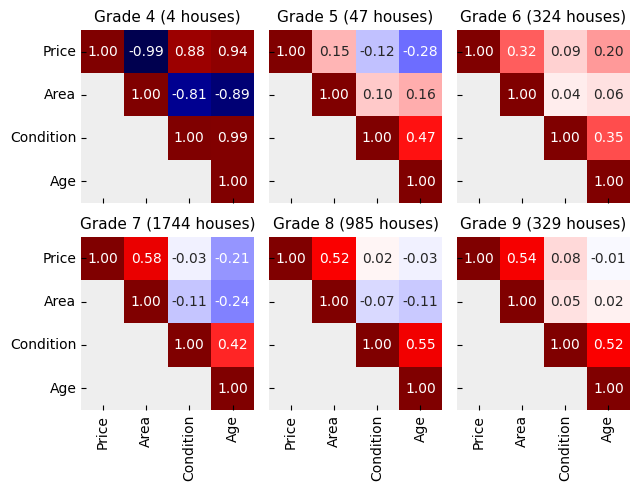

In [ ]:
dfp_z4 = dfp.query('dist_from_center > 45') 
groups = dfp_z4[['price', 'm2_living', 'condition', 'age', 'grade']].groupby('grade')

fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(6.5,5), sharex=True, sharey=True)
labels = ['Price', 'Area', 'Condition', 'Age']
for g, a in zip(range(4,10), axs.ravel()):
    corm = groups.get_group(g).drop('grade', axis=1).corr()
    a = corr_matrix_plot(corm, labels=labels, ax=a)
    a.set_title(f'Grade {g} ({groups.get_group(g).shape[0]} houses)', fontsize=11)
    a.grid(False)
plt.tight_layout()
plt.show()

Among the **rural** houses:
* Price of the buildings of `grade 5 and 7` is negatively affected by building's age. *Despite the fact that...*
* ...that houses of `any grade` do `age` well, and the older the house, the better its `condition` - *they knew how to build things right back in the days!* 
* `Condition` does not have an influence on price, or this effect is neglegible
* The living `area` positively affects house price - starting from `grade 6` 
* Houses of `grade 4` are not eligible for statistical analysis

||
|--|
| We just learned that house appreciation varies between the central urban and remote rural areas. This means, it make the most sence to split the data set and analyse the urban and rural areas separately!|
||

In [80]:
dfp_r = dfp[dfp.dist_from_center > 32.5]
dfp_c = dfp[dfp.dist_from_center <= 32.5]

Pearson coefficients only accounts for linear correlations. Let's examine the dependencies more closely:

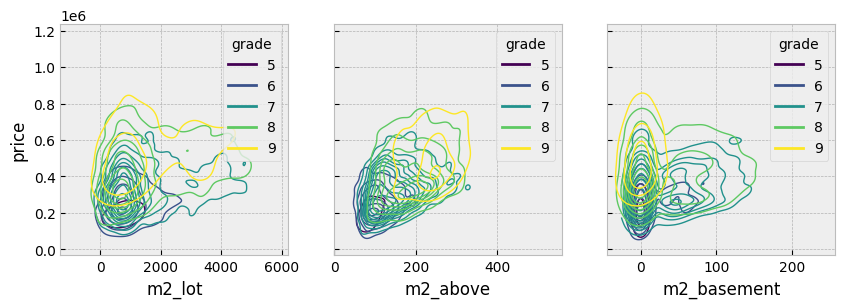

In [87]:
x_vars = ['m2_lot', 'm2_above', 'm2_basement', 'floors',
       'bedrooms', 'bathrooms']
y_vars = ["price"]

fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(10,3), sharey=True)
legend=False
for x_var, ax in zip(x_vars, axs):
    if x_var == x_vars[-1]:
        legend=True
    kde = sns.kdeplot(dfp_r[(dfp_r.m2_lot < 5000) & (dfp_r.grade > 4) & (dfp_r.grade < 10)], 
                      hue='grade', palette='viridis',
                      y="price", x=x_var, linewidths=1, levels=10, ax=ax)

* The **`area` has a strong effect on the `price`** (but the correlation is multivariate)
    * And the presence and area of the `basement` does not make a difference
* The price is also correlated with the number of `bedrooms` and `bathrooms`, but we know that these features are *collinear* with the house `area` and with each other: the number of rooms generally increases with the livable space.

Let's investigate the influence of the house `condition`,  `age` and `grade` on the price:

* The group of the poorest houses (`grade = 4`) is the only one whose price is negatively affected by the house age, which agrees with the common sense: cheapest materials don't age well at all. Unfortunately, this group comprises only 27 entries, which is too few for statistical evaluation.
    * However, house appreciation with the age indeed seems to be the case for the *average* quality groups (`grade = 7 or 8`)
* House `area` is positively correlated with the price for *any group*.  
* House `condition` has **surprisingly little effect on the price**, especially within the quality range of interest (`grade <= 7`)

<!-- Since we know the influence of the area on the house price, we'll look only on the normalized `price per square meter` from now on. -->


### Effect of the building `condition` on the `price of a square meter`

In [57]:
ren_cond = dfp[['p_per_m2', 'price', 'grade', 'condition']].groupby(['condition']).mean()                        \
            .join(dfp[['p_per_m2', 'price', 'grade', 'condition']].groupby(['condition']).std(), rsuffix='_std')
ren_cond = ren_cond.join(dfp[['price', 'condition']].groupby(['condition']).count(), rsuffix='_count')
ren_cond.rename({'price_count': 'count'}, axis=1, inplace=True)
ren_cond.head().style.format(precision=1)

,p_per_m2,price,grade,p_per_m2_std,price_std,grade_std,count
condition,,,,,,,
1,2858.6,299676.8,5.9,1608.5,161372.0,0.9,28
2,2566.6,309704.7,6.5,1326.6,164353.2,0.9,168
3,2671.8,478882.3,7.7,1035.3,204513.8,1.1,13263
4,2808.8,464679.9,7.3,1145.5,206699.7,0.9,5411
5,3058.3,516082.7,7.1,1088.6,223367.6,0.8,1556


In [170]:
fig = filledline(ren_cond, 'p_per_m2', 'p_per_m2_std', 
                 title='Building condition influence on the price<br>(size: number of houses)',
                 xlabel='Grade', ylabel='Price per m2')
fig.update_layout(width=800, height=400,
                  xaxis=dict(
                        tickvals=[1, 2, 3, 4, 5],    
                        ticktext=['Worn out', 'Badly worn', 'Average', 'Good', 'Very good']),  )
fig.show()

- **The building `condition` only marginally affects the `price of a square meter`**

In [61]:
ren_grade = dfp[['p_per_m2', 'price', 'grade', 'condition']].groupby(['grade']).mean() \
            .join(dfp[['p_per_m2', 'price', 'grade', 'condition']].groupby(['grade']).std(), rsuffix='_std')
ren_grade = ren_grade.join(dfp[['price', 'grade']].groupby(['grade']).count(), rsuffix='_count')
ren_grade.rename({'price_count': 'count'}, axis=1, inplace=True)

ren_grade.head().style.format(precision=1)

,p_per_m2,price,condition,p_per_m2_std,price_std,condition_std,count
grade,,,,,,,
3,5423.4,262000.0,5.0,nan,nan,nan,1
4,3681.4,212001.9,3.1,2060.4,97294.5,0.8,27
5,3002.4,248524.0,3.5,1680.2,118100.3,0.9,242
6,2914.3,301475.7,3.5,1301.4,121360.4,0.8,2037
7,2706.8,401148.8,3.5,1140.3,150984.9,0.7,8960


In [171]:
fig = filledline(ren_grade, 'p_per_m2', 'p_per_m2_std', xcol=None, 
                 title='Building condition influence on the price<br>(size: number of houses)',
                 xlabel='Grade', ylabel='Price per m2')
fig.update_layout(width=800, height=400,
                  xaxis=dict(tickvals=[3, 4, 5, 6, 7, 7, 8, 9, 10, 11, 12]))
fig.show()

- **The building `grade` almost does not affect the `price of a square meter`**

# Generating investment recommendations

Let's summarize what we know:
- The absolute `price of a square meter` is most affected by the proximity to the Seattle downtown but dips for particular areas (*George town*, *White city*) 
- The `price of a square meter` is **not** affected by building `grade`, `condition` or house features (floors, rooms, etc). 

But the living conditions can be increased together with the price by building up! For this, we may want to consider large `lots`.

* Focus on renovation may yield little to know return. This means, the object shoud have either a large appreciation portential and be cheap - and in a bad condition - or be already cheap enough. 

* When the low-quality neighborhoods can *potentially* be appreciated when renovated in bulk, in a very long term. This is a heavy-lifting strategy which requires a large budget and effort for dense *central* areas.

* However, when targeting a *rural* area with only a few houses close together, one can hope to make the area more prestigious at once much quicker. The price will however, inherently remain much lower than for the *central* areas.


It seems reasonable to focus on two strategies:
|High risk / high reward|Conservative|
|:---:|:---:|
|Central houses in bad condition. They may be still expensive, they would require a lot of resources to renovate. However, there is a large potential for price increase. | Houses on the outskirts in average condition. Only minor renovations would be needed (rather, construction works), but the price will never be comparable to the central houses |

## Defining and investigating the target subset

According to our Client's interests, we can restrict our sample with the following considerations:

- Small concentrations of low-graded houses can be found anywhere, but there are some neighborhoods that are on average much worse that others 
     - We can focus on the `zipcodes` with the `mean grade < 7.X` (see below)
     
     - Within these neighborhoods, we are only interested in the houses of `grade < 7` 

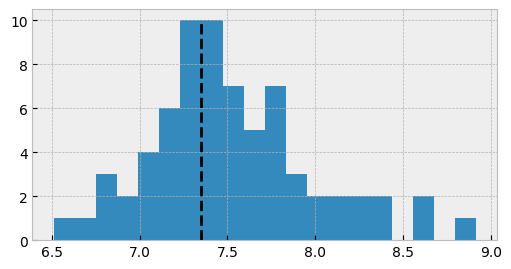

In [91]:
GRADE_CUTOFF = 7.35

nbhds = dfp.loc[:, 'grade zipcode'.split()] \
           .groupby('zipcode').mean()
nbhds.reset_index().grade.hist(bins=20, figsize=(6,3))
plt.vlines(x=[GRADE_CUTOFF], ymin=0, ymax=10, colors='k', linestyles='dashed');
plt.show()

We are interested in houses to the left of the dashed line.

In [92]:
zipcodes = nbhds[nbhds['grade'] <= GRADE_CUTOFF].index

dfpt = dfp[dfp.zipcode.isin(zipcodes)]
dfpt = dfpt[dfpt.grade <= 6]
dfpt = dfpt[dfpt.condition <= 4]

In [19]:
dfpt.drop(['id', 'zipcode', 'lat', 'long'], axis=1).describe().style.format(precision=1)

,bedrooms,bathrooms,m2_living,m2_lot,floors,waterfront,view,condition,grade,m2_above,m2_basement,yr_built,yr_renovated,m2_living15,m2_lot15,price,basement_share,age,yrs_since_renovation,p_per_m2
count,1400.0,1400.0,1400.0,1400.0,1400.0,1400.0,1395.0,1400.0,1400.0,1400.0,1400.0,1400.0,42.0,1400.0,1400.0,1400.0,1400.0,1400.0,42.0,1400.0
mean,2.6,1.2,105.6,1103.5,1.1,0.0,0.1,3.3,5.9,94.8,10.8,1939.8,1991.9,124.9,925.7,275564.9,0.1,75.2,23.1,2803.8
std,0.9,0.4,36.4,5205.4,0.2,0.1,0.5,0.6,0.4,29.1,23.5,18.4,20.0,29.8,2242.5,104500.8,0.2,18.4,20.0,1220.4
min,1.0,0.5,35.3,152.5,1.0,0.0,0.0,1.0,4.0,35.3,0.0,1900.0,1945.0,57.6,111.3,78000.0,0.0,0.0,1.0,943.4
25%,2.0,1.0,79.0,478.9,1.0,0.0,0.0,3.0,6.0,74.3,0.0,1926.0,1983.0,104.1,486.2,205000.0,0.0,65.8,7.2,1920.0
50%,2.0,1.0,98.0,634.3,1.0,0.0,0.0,3.0,6.0,88.3,0.0,1943.0,1995.0,120.8,656.1,257000.0,0.0,72.0,20.0,2537.8
75%,3.0,1.0,124.5,805.5,1.0,0.0,0.0,4.0,6.0,108.7,0.0,1949.2,2007.8,141.2,784.3,332625.0,0.0,89.0,32.0,3478.8
max,7.0,3.8,362.3,153415.0,2.5,1.0,4.0,4.0,6.0,321.4,114.3,2015.0,2014.0,277.8,39537.4,970000.0,0.7,115.0,70.0,8532.4


We are left with $1602$ houses. 
* The most expensive house costs $ $0.97 M$
* Some of them are located next at the `waterfront`
* At least one house has an amazing view of 4!
* The tallest house has 3.5 floors

Let's not look at the very large lots - for now:

In [219]:
fig = geoplot(dfpt, size_col='grade', color_col='condition', 
    title='<b>The target group</b> <br> Color for <i>condition</i>, dot size for the <i>grade</i>', 
    marker_max_size=15, alpha=0.8,
    colorscheme=px.colors.make_colorscale(['#0c468f', '#0b6ca8', '#f2d338']) #'#f29738'
    )
fig.update_layout(title_font_size=16)
fig.show()

In the plot above, we are interested in the clusters of **big** points of <span style="color:#7e9f70">**green** </span> and <span style="color:#0b62a2">**blue** </span>colors.

We will ignore the clusters of <span style="color:#f2cb38">**yellow** </span> dots, because they together form a relatively "good" neighborhood.

<!-- 
#0b62a2 blue
#7e9f70 green
#f2cb38 yellow
#f29738 orange-->

* Central areas:
    - **White center**, **Rainer Valley** and generally the area **around the Boeing Field** seems in the most dire need of improvement!
    - Areas in the north (like **Maple Leaf** and **Lake City**) can form a secondary interest.  

* Rural areas:
    - A few objects in **Carnation** and the houses in **Fall City** can be interest. 

> Focus on the dence neighborhoods close to the downtown or on the satellite towns in the remote regions can form the basis for two investment strategies. 
<!-- We'll remember this for the final part of the analysis when we are making investment recommendations. -->

# Generating investment recommendations

Let's summarize what we know:
- The `price of a square meter` is most affected by the proximity to the Seattle downtown but dips for particular areas (*George town*) 
- The `price of a square meter` is **not** affected by building `grade`, `condition` or house features (floors, rooms, etc). 

> Price is mostly defined by the area and location and not house condition, overall grade or features (floors, rooms, etc)

* The living condition can be increased together with the price by building up! For this, we may want to consider large `lots`.

* Focus on renovation may yield little to know return. This means, the object shoud have either a large appreciation portential and be cheap - and in a bad condition - or be already cheap enough. 

* When the low-quality neighborhoods can *potentially* be appreciated when renovated in bulk, in a very long term. This is a heavy-lifting strategy which requires a large budget and effort for dense *central* areas.

* However, when targeting a *rural* area with only a few houses close together, one can hope to make the area more prestigious at once much quicker. The price will however, inherently remain much lower than for the *central* areas.


It seens reasonable to focus on two strategies:
* Bad conditions - central location
OR
* Average condition - outskirts & rural 


Let's split up our data into the subsets for 'rural' and 'city' strategies:

In [93]:
BOEING_FIELD = (47.528216280061386, -122.29910095638786)
MAPLE_LEAF_LAKE_CITY = (47.69698168911886, -122.31880092501825) # includes the entire northen district
FALL_CITY_CARNATION = (47.6176633626924, -121.91149313824661)

dft_west = dfpt[geo_distance_km(BOEING_FIELD, (dfpt.lat, dfpt.long)) < 9]
dft_north = dfpt[geo_distance_km(MAPLE_LEAF_LAKE_CITY, (dfpt.lat, dfpt.long)) < 2]

# City
dft_city = pd.concat((dft_west, dft_north))

# Rural
dft_rural = dfpt[geo_distance_km(FALL_CITY_CARNATION, (dfpt.lat, dfpt.long)) < 15]

In [30]:
fig = geoplot(pd.concat((dft_city, dft_rural)), size_col='grade', color_col='price', 
    title='<b>The target group</b> <br> Color for <i>price</i>, dot size for the <i>grade</i>', 
    marker_max_size=15,
    colorscheme='Cividis'
    )
fig.update_layout(title_font_size=16)

fig.show()

Let's combine the subsets into one dataframe for convenience. We will keep the split by labelling them

In [94]:
dft_north['strategy'] = 'city'
dft_north['region'] = 'north'

dft_west['strategy']  = 'city'
dft_west['region']  = 'west'

dft_rural['strategy'] = 'rural'
dft_rural['region'] = 'rural'

dft = pd.concat((dft_north, dft_west, dft_rural))

A small cleaning step. The distribution of `lot size` is too skewed:

In [45]:
fig = px.box(dft, x='m2_lot', width=900, height=150, template='seaborn')
fig.update_layout(margin={'l':0, 't':0, 'r':0, 'b': 30})
fig.show()

Let's not look at the largest lots for the time being.

In [95]:
# Cutoff at ca. 1.5 IQR
dft = dft[dft.m2_lot < 1300]

fig = px.box(dft, x='m2_lot', width=900, height=150, template='seaborn')
fig.update_layout(margin={'l':0, 't':0, 'r':0, 'b': 30})
fig.show()

## What affects the price of a square meter within the target quality group?

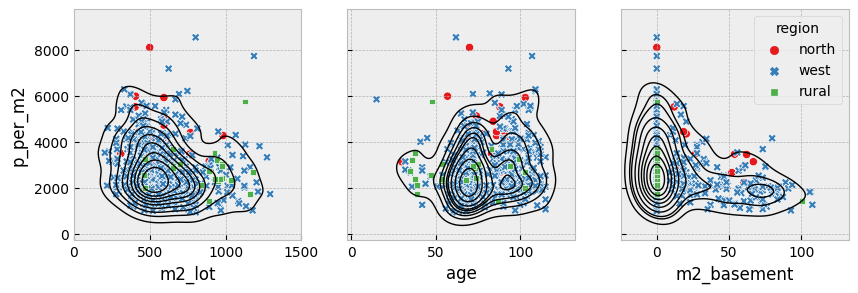

In [80]:
x_vars = ['m2_lot', 'age', 'm2_basement']
y_vars = ["p_per_m2"]

fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(10,3), sharey=True)
legend=False
for x_var, ax in zip(x_vars, axs):
    if x_var == x_vars[-1]:
        legend=True
    sc = sns.scatterplot(dft, y="p_per_m2", x=x_var, hue='region', style='region', palette='Set1', 
                    ax=ax, legend=legend)
    kde = sns.kdeplot(dft, y="p_per_m2", x=x_var, color='k', hue=None, linewidths=1, levels=10, ax=ax)

* The large lots are rare, and all of them are within the lower price range
* Buildings with large basements are within the lower price range
    * And there is only a single rural house with basement!
* Most of our buildings are old Age starts making *some* effect starting from 55 years

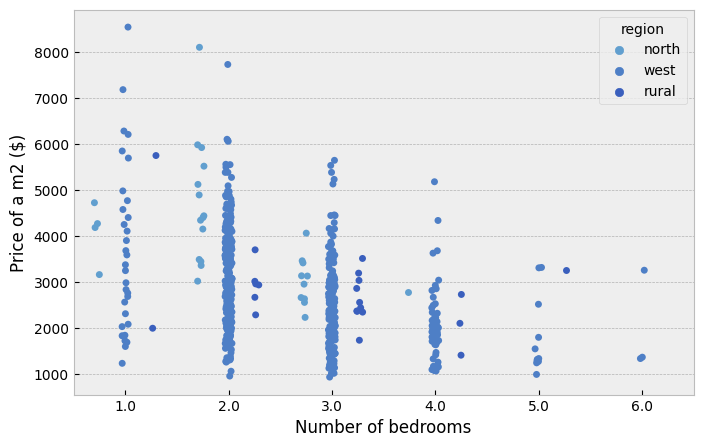

In [100]:
x_vars = ['floors', 'bedrooms', 'bathrooms']
y_vars = ["p_per_m2"]

sns.stripplot(dft, x='bedrooms', y='p_per_m2', hue='region', 
              dodge=True, palette=sns.color_palette("blend:#619fcf,#0000a3"), 
              )
plt.xlabel('Number of bedrooms')
plt.ylabel('Price of a m2 ($)');

## Strategy I: invest in the development of White center

In [99]:
query = 'condition < 3 and m2_lot > 3000'
dfp_c

,id,bedrooms,bathrooms,m2_living,m2_lot,floors,waterfront,view,condition,grade,m2_above,m2_basement,yr_built,yr_renovated,zipcode,lat,long,m2_living15,m2_lot15,sale_date,price,basement_share,age,yrs_since_renovation,p_per_m2,dist_from_center
0,7129300520,3.0,1.00,109.624675,524.897808,1.0,0,0.0,3,7,109.624675,0.000000,1955,NaN,98178,47.5112,-122.257,124.489038,524.897808,2014-10-13,221900.0,0.000000,60,NaN,2024.2,16.448219
1,6414100192,3.0,2.25,238.758826,672.798216,2.0,0,0.0,3,7,201.597919,37.160907,1951,1991.0,98125,47.7210,-122.319,157.004831,709.680416,2014-12-09,538000.0,0.155642,64,24.0,2253.3,31.706608
3,2487200875,4.0,3.00,182.088443,464.511334,1.0,0,0.0,5,7,97.547380,84.541063,1965,NaN,98136,47.5208,-122.393,126.347083,464.511334,2014-12-09,604000.0,0.464286,50,NaN,3317.1,19.612688
4,1954400510,3.0,2.00,156.075808,750.650316,1.0,0,0.0,3,8,156.075808,0.000000,1987,NaN,98074,47.6168,-122.045,167.224080,697.045708,2015-02-18,510000.0,0.000000,28,NaN,3267.6,14.356737
7,2414600126,3.0,1.00,165.366035,693.979933,1.0,0,0.0,3,7,97.547380,67.818655,1960,NaN,98146,47.5123,-122.337,165.366035,753.716091,2015-04-15,229500.0,0.410112,55,NaN,1387.8,18.500811
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20421,263000018,3.0,2.50,142.140468,105.072464,3.0,0,0.0,3,8,142.140468,0.000000,2009,NaN,98103,47.6993,-122.346,142.140468,140.189521,2014-05-21,360000.0,0.000000,6,NaN,2532.7,27.760890
20422,6600060120,4.0,2.50,214.604236,540.040877,2.0,0,0.0,3,8,214.604236,0.000000,2014,NaN,98146,47.5107,-122.362,170.011148,668.896321,2015-02-23,400000.0,0.000000,1,NaN,1863.9,19.831633
20423,1523300141,2.0,0.75,94.760312,125.418060,2.0,0,0.0,3,7,94.760312,0.000000,2009,NaN,98144,47.5944,-122.299,94.760312,186.454849,2014-06-23,402101.0,0.000000,6,NaN,4243.3,7.199838
20424,291310100,3.0,2.50,148.643627,221.850613,2.0,0,0.0,3,8,148.643627,0.000000,2004,NaN,98027,47.5345,-122.069,130.992196,119.565217,2015-01-16,400000.0,0.000000,11,NaN,2691.0,15.099576


## Strategy II: building up in Fall City 

In [98]:
query = 'condition < 3 and m2_lot > 3000'

dft_rural.query(query)

,id,bedrooms,bathrooms,m2_living,m2_lot,floors,waterfront,view,condition,grade,m2_above,m2_basement,yr_built,yr_renovated,zipcode,lat,long,m2_living15,m2_lot15,sale_date,price,basement_share,age,yrs_since_renovation,p_per_m2,dist_from_center,strategy,region
14131,1125079088,2.0,1.0,123.560015,8619.65812,1.0,0,0.0,2,6,123.560015,0.0,1950,NaN,98014,47.6624,-121.868,118.914902,15620.680045,2015-04-02,455000.0,0.0,65,NaN,3682.4,31.005017,rural,rural
18205,1324079029,3.0,1.0,89.186176,19788.92605,1.0,0,0.0,2,6,89.186176,0.0,1933,NaN,98024,47.5621,-121.862,141.211446,5341.787440,2015-03-17,200000.0,0.0,82,NaN,2242.5,26.439194,rural,rural


---

# Extras
## House resales

Erin Robinson is mostly long-term oriented investor, but is there any chance for her to sell the property fast? 

In [26]:
sales = df[['id', 'sale_date']].groupby('id').count()
sales.rename(columns={'sale_date': 'sale_count'}, inplace=True)
sales.sort_values('sale_count', ascending=False)

,sale_count
id,
795000620,3
1000102,2
3578401060,2
3528000040,2
4345000510,2
...,...
2768000270,1
2767900355,1
2767800140,1


The absolute majority of properties - as expected - were traded only once during this year (May 2014 - May 2015). 

With a single case of three sales and anecdotal re-sales **it is not much of a time series analysis we can do**. 

On the other hand, the outlier property `ID 795000620` that has been resold three times over the year may be a problematic case for explicit or not reasons. Alternatively, this was someone's highly speculative investment idea. 

In [ ]:
df = df.set_index('id').join(sales).reset_index()
resold = df[df.sale_count > 1]

profits = resold[['price', 'id']].groupby('id', as_index=True).diff().dropna()
profits.rename(columns={'price':'profit'}, inplace=True)
#profits
resold = resold.drop(['sale_date', 'sale_count'], axis=1).join(profits, how='inner', )

In [ ]:
resold.hist(column=['price', 'age', 'condition', 'yrs_since_renovation' ], bins=50, figsize=(12,3),layout=(1,4))
plt.gcf().tight_layout();